In [3]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import matplotlib.pyplot as plt
from glob import glob
import os
import matplotlib.pyplot as plt

In [4]:
train_path = "/kaggle/input/fruit-and-vegetable-image-recognition/train"
test_path = "/kaggle/input/fruit-and-vegetable-image-recognition/test"
valid_path ="/kaggle/input/fruit-and-vegetable-image-recognition/validation"

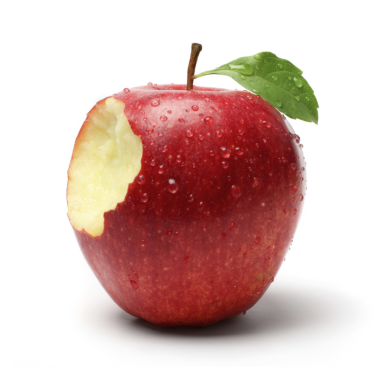

In [5]:
img = load_img(train_path + "/apple/Image_1.jpg")
plt.imshow(img)
plt.axis("off")
plt.show()

In [6]:
x = img_to_array(img)
print(x.shape)

className = glob(train_path + '/*' )
numberOfClass = len(className)
print("NumberOfClass: ",numberOfClass)

(2216, 2218, 3)
NumberOfClass:  36


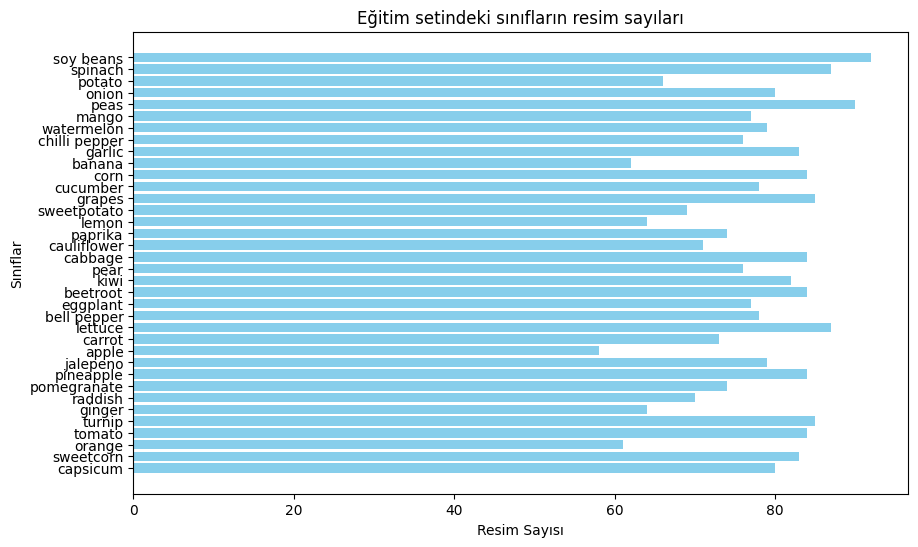

In [5]:
# Her sınıftaki görüntü dosyalarının sayısını belirleyin
class_counts = {}
for class_dir in className:
    class_name = os.path.basename(class_dir)
    class_counts[class_name] = len(glob(os.path.join(class_dir, '*.jpg')))

# Sınıf isimlerini ve görüntü sayılarını ayrı listelere ayırın
classes = list(class_counts.keys())
counts = list(class_counts.values())

# Çubuk grafik oluşturun
plt.figure(figsize=(10, 6))
plt.barh(classes, counts, color='skyblue')
plt.xlabel('Resim Sayısı')
plt.ylabel('Sınıflar')
plt.title('Eğitim setindeki sınıfların resim sayıları')
plt.show()


# CNN Modeli

In [27]:
# Örnek bir giriş şekli belirleyin (örneğin 64x64x3)
input_shape = (224,224,3) 

# CNN Model
model = Sequential()
model.add(Input(shape=input_shape))
model.add(Conv2D(32, (3, 3)))
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3, 3)))
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Conv2D(64, (3, 3)))
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Flatten())
model.add(Dense(1024))
model.add(Activation("relu"))
model.add(Dropout(0.5))
model.add(Dense(numberOfClass))  # output
model.add(Activation("softmax"))

model.compile(loss="categorical_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

batch_size = 32


In [28]:
# Veri artırma ve ön işleme için ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    shear_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3
)

valid_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Eğitim verilerini yükleme ve yeniden boyutlandırma
train_generator = train_datagen.flow_from_directory(
    train_path, 
    target_size=(224, 224),
    batch_size=32,  # batch_size burada belirlenir
    color_mode="rgb",
    class_mode="categorical"
)

# Doğrulama verilerini yükleme ve yeniden boyutlandırma
validation_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical"
)

# Test verilerini yükleme ve yeniden boyutlandırma
test_generator = test_datagen.flow_from_directory(
    test_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False  # Sıralamanın karışmaması için shuffle=False
)



Found 3115 images belonging to 36 classes.

Found 351 images belonging to 36 classes.

Found 359 images belonging to 36 classes.


In [29]:
# Modeli eğitme
hist = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

  self._warn_if_super_not_called()


 1/97 ━━━━━━━━━━━━━━━━━━━━ 33:22 21s/step - accuracy: 0.0000e+00 - loss: 3.5964


I0000 00:00:1718793167.906874     217 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.

W0000 00:00:1718793167.925690     217 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images

  warnings.warn(


 5/97 ━━━━━━━━━━━━━━━━━━━━ 2:16 1s/step - accuracy: 0.0229 - loss: 7.2983

W0000 00:00:1718793173.794332     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


96/97 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.0647 - loss: 4.0470

W0000 00:00:1718793306.118302     216 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.0653 - loss: 4.0344 - val_accuracy: 0.2250 - val_loss: 2.6629

Epoch 2/100

 1/97 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - accuracy: 0.2500 - loss: 2.7150

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.

  self.gen.throw(typ, value, traceback)


97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.2500 - loss: 2.7150 - val_accuracy: 0.1290 - val_loss: 2.8219

Epoch 3/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.1828 - loss: 2.8297 - val_accuracy: 0.3812 - val_loss: 2.0525

Epoch 4/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.1818 - loss: 2.4911 - val_accuracy: 0.2903 - val_loss: 1.9349

Epoch 5/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.2500 - loss: 2.5019 - val_accuracy: 0.4781 - val_loss: 1.8091

Epoch 6/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - accuracy: 0.2812 - loss: 2.4386 - val_accuracy: 0.4516 - val_loss: 1.8712

Epoch 7/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.2961 - loss: 2.2977 - val_accuracy: 0.5156 - val_loss: 1.5960

Epoch 8/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3125 - loss: 1.7937 - val_accuracy: 0.4839 - val_loss: 1.5321

Epoch 9/100

97/97 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.3604 - loss: 2.1557 - val_accuracy:

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9390 - loss: 0.5401 

Test accuracy: 0.9545454382896423


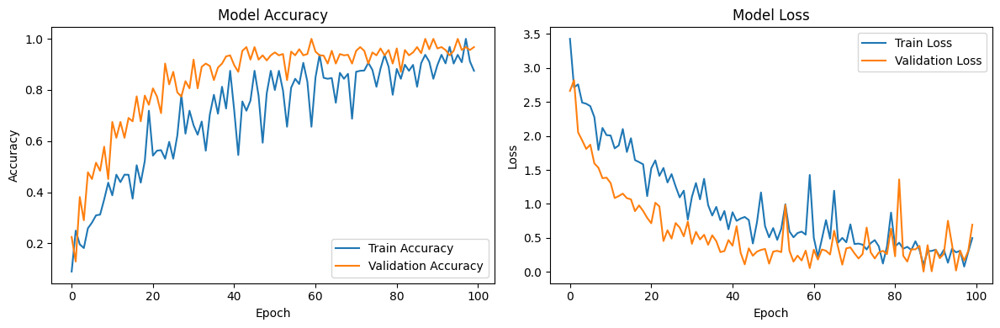

In [35]:
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Modeli değerlendirme
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // batch_size)
print('Test accuracy:', accuracy)

# Eğitim ve doğrulama accuracy ve loss grafiklerini çizme
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(hist.history['accuracy'], label='Train Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist.history['loss'], label='Train Loss')
plt.plot(hist.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()



/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

  self._warn_if_super_not_called()


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 906ms/step


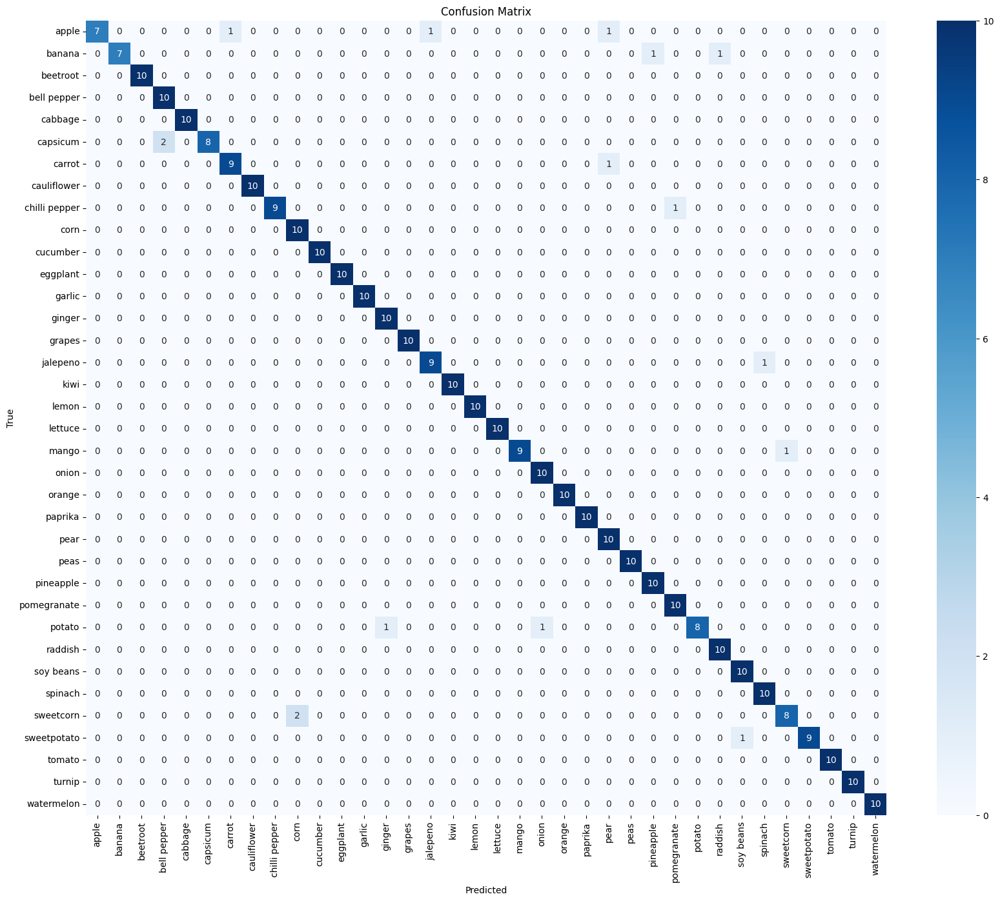

In [54]:
# Test verileri üzerinde tahminlerde bulunma
test_generator.reset()  # Generator'ı sıfırlamak önemli
predictions = model.predict(test_generator)

# Tahminleri sınıf etiketlerine dönüştürme
predicted_classes = np.argmax(predictions, axis=1)

# Gerçek etiketleri elde etme
true_classes = test_generator.classes

# Sınıf isimlerini elde etme
class_labels = list(test_generator.class_indices.keys())

# Confusion matrix'i oluşturma
cm = confusion_matrix(true_classes, predicted_classes)

# Confusion matrix'i görselleştirme
plt.figure(figsize=(20, 16))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [55]:
# Test verilerinden birkaç örneği manuel olarak kontrol etme
for i in range(5):
    print(f"True label: {true_classes[i]}, Predicted label: {predicted_classes[i]}")


True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 6


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


W0000 00:00:1718802102.286232     215 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


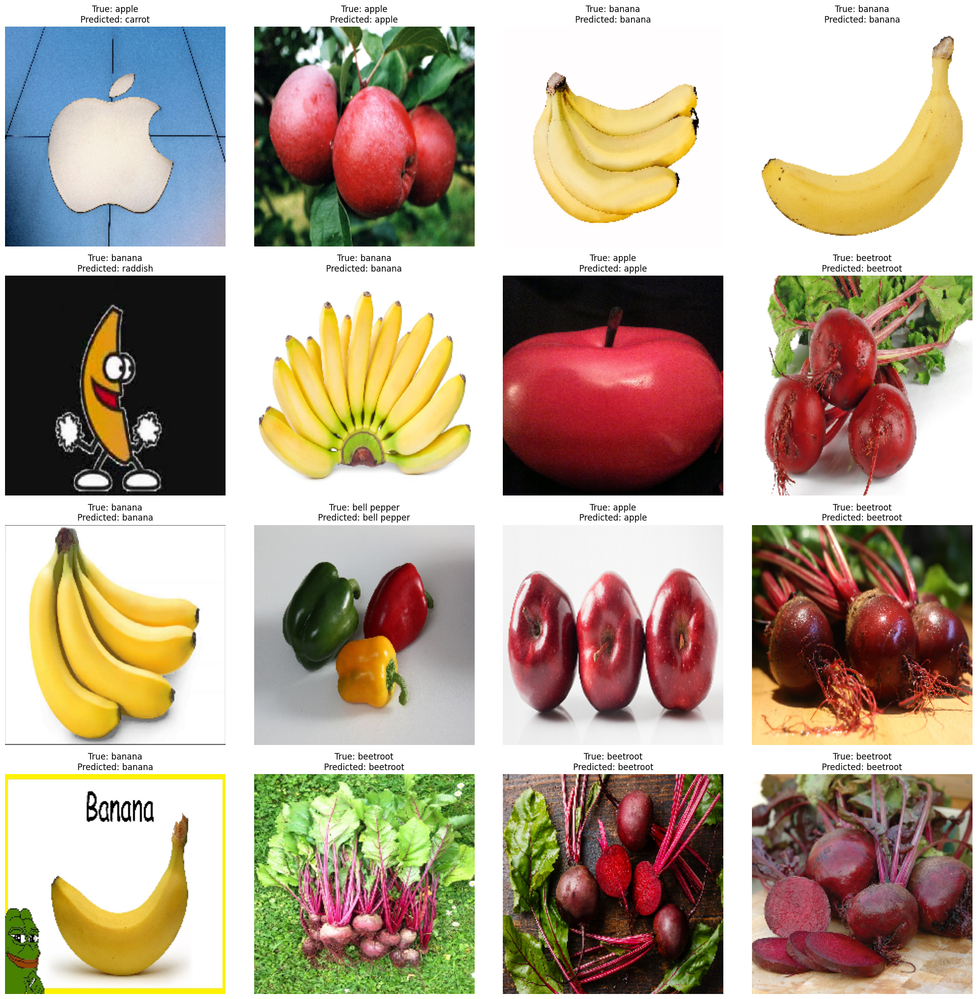

In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Test veri setinden bir batch alın
test_generator.reset()
batch = next(test_generator)

# Batch içinden rastgele 16 örnek seç
num_samples = 16
indices = np.random.choice(range(len(batch[0])), num_samples, replace=False)
sample_images = batch[0][indices]
sample_labels = batch[1][indices]

# Tahminlerde bulun
predictions = model.predict(sample_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(sample_labels, axis=1)
class_labels = list(test_generator.class_indices.keys())

# Görselleri gösterme
plt.figure(figsize=(20, 20))
for i in range(num_samples):
    plt.subplot(4, 4, i + 1)
    plt.imshow(sample_images[i])
    plt.axis('off')
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')

plt.tight_layout()
plt.show()


In [65]:
# Model ağırlıklarını kaydetme
model.save_weights("deneme.weights.h5")


[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


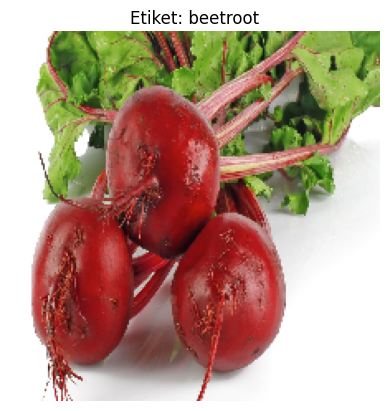

In [68]:
import matplotlib.pyplot as plt
import numpy as np

# Test veri kümesinden bir batch alın
test_generator.reset()
batch = next(test_generator)

# 25. resmi seçin (0'dan başlayarak indeksleme)
index = 24  # 25. resim (indeks 24)
image = batch[0][index]
label = batch[1][index]
# Etiketleri dönüştürme (one-hot vektörden sınıf adına)
class_labels = list(test_generator.class_indices.keys())
true_label = class_labels[np.argmax(label)]

# Resmi ve etiketi görselleştirme
plt.imshow(image)
plt.title(f'Etiket: {true_label}')
plt.axis('off')
plt.show()


In [71]:
len(batch[1])

32

# KNN Modeli 

In [81]:
import os
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import seaborn as sns

# Veri seti yolları
train_path = "/kaggle/input/fruit-and-vegetable-image-recognition/train"
test_path = "/kaggle/input/fruit-and-vegetable-image-recognition/test"
valid_path = "/kaggle/input/fruit-and-vegetable-image-recognition/validation"




In [82]:
# Eğitim verilerini yükleme ve önişleme
train_classes = os.listdir(train_path)
X_train = []
y_train = []

for idx, class_name in enumerate(train_classes):
    class_path = os.path.join(train_path, class_name)
    for img_file in os.listdir(class_path):
        img_path = os.path.join(class_path, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        X_train.append(img_array.flatten())  # Örnekleri düzleştirin
        y_train.append(idx)  # Sınıf etiketini ekleyin

X_train = np.array(X_train)
y_train = np.array(y_train)

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images

  warnings.warn(


In [83]:
X_train.shape #düzleştirme yaptığımız için 224*224*3 =150528

(3115, 150528)

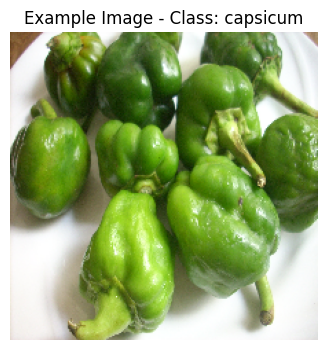

In [85]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img

# X_train içinden bir örnek seçme (örneğin, ilk örneği seçelim)
img_array = X_train[0].reshape(224, 224, 3)  # Örnek boyutlarına yeniden şekillendirme

# Görüntüyü array_to_img fonksiyonu ile Image objesine dönüştürme
img = array_to_img(img_array)

# Görüntüyü görselleştirme
plt.figure(figsize=(4, 4))
plt.imshow(img)
plt.axis('off')
plt.title(f'Example Image - Class: {train_classes[y_train[sample_idx]]}')
plt.show()


In [75]:
# KNN modelini oluşturma ve eğitme
k = 5  # KNN'de kullanılacak komşu sayısı
knn_classifier = KNeighborsClassifier(n_neighbors=k)
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [76]:
# Test verilerini yükleme ve önişleme
test_classes = os.listdir(test_path)
X_test = []
y_test = []

for idx, class_name in enumerate(test_classes):
    class_path = os.path.join(test_path, class_name)
    for img_file in os.listdir(class_path):
        img_path = os.path.join(class_path, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        X_test.append(img_array.flatten())  # Örnekleri düzleştirin
        y_test.append(idx)  # Gerçek sınıf etiketini ekleyin

X_test = np.array(X_test)
y_test = np.array(y_test)

              precision    recall  f1-score   support



           0       0.42      0.50      0.45        10

           1       0.44      0.80      0.57        10

           2       0.80      0.80      0.80        10

           3       0.60      0.60      0.60        10

           4       0.45      0.90      0.60        10

           5       0.50      0.60      0.55        10

           6       0.44      0.40      0.42        10

           7       0.80      0.80      0.80        10

           8       0.58      0.70      0.64        10

           9       0.71      0.50      0.59        10

          10       0.57      0.40      0.47        10

          11       0.67      0.60      0.63        10

          12       0.73      0.80      0.76        10

          13       0.88      0.70      0.78        10

          14       0.83      0.50      0.62        10

          15       0.77      1.00      0.87        10

          16       0.73      0.80      0.76        10

        

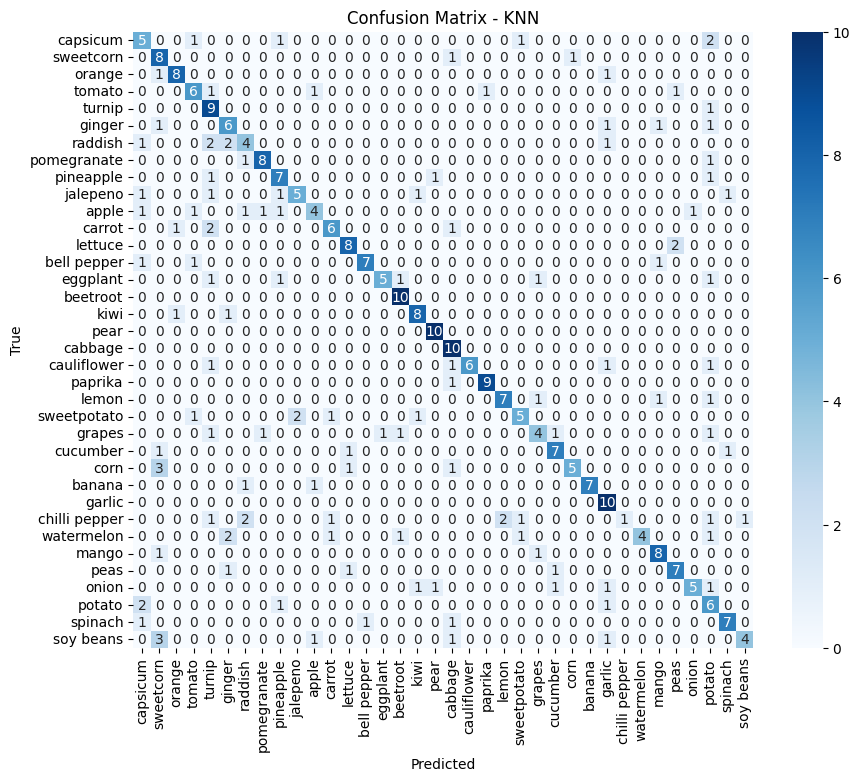

In [77]:
# Modeli değerlendirme
y_pred = knn_classifier.predict(X_test)

# Sınıflandırma raporu ve confusion matrix hesaplama
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Confusion matrix'i görselleştirme
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=train_classes, yticklabels=train_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - KNN')
plt.show()

# Logistic Regresyon

In [8]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Veri artırma ve ön işleme için ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    shear_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3
)

valid_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Eğitim verilerini yükleme ve yeniden boyutlandırma
train_generator = train_datagen.flow_from_directory(
    train_path, 
    target_size=(224, 224),
    batch_size=32,  # batch_size burada belirlenir
    color_mode="rgb",
    class_mode="categorical",
    shuffle=True
)

# Test verilerini yükleme ve yeniden boyutlandırma
test_generator = test_datagen.flow_from_directory(
    test_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False  # Sıralamanın karışmaması için shuffle=False
)




Found 3115 images belonging to 36 classes.

Found 359 images belonging to 36 classes.


In [9]:
# Eğitim verilerini numpy dizilerine dönüştürme
X_train = []
y_train = []
for _ in range(len(train_generator)):
    x_batch, y_batch = next(train_generator)
    X_train.append(x_batch)
    y_train.append(y_batch)

X_train = np.concatenate(X_train)
y_train = np.concatenate(y_train)



/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images

  warnings.warn(


In [10]:
# Test verilerini numpy dizilerine dönüştürme
X_test = []
y_test = []
for _ in range(len(test_generator)):
    x_batch, y_batch = next(test_generator)
    X_test.append(x_batch)
    y_test.append(y_batch)

X_test = np.concatenate(X_test)
y_test = np.concatenate(y_test)



In [11]:
# Verileri düzleştirme
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = np.argmax(y_train, axis=1)
y_test = np.argmax(y_test, axis=1)



In [12]:
# Logistic Regression modelini oluşturma ve eğitme
logistic_classifier = LogisticRegression(max_iter=1000)
logistic_classifier.fit(X_train, y_train)



/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



Increase the number of iterations (max_iter) or scale the data as shown in:

    https://scikit-learn.org/stable/modules/preprocessing.html

Please also refer to the documentation for alternative solver options:

    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000)

              precision    recall  f1-score   support



           0       0.00      0.00      0.00        10

           1       0.56      0.56      0.56         9

           2       0.17      0.10      0.12        10

           3       0.47      0.80      0.59        10

           4       0.60      0.60      0.60        10

           5       0.40      0.40      0.40        10

           6       0.44      0.40      0.42        10

           7       0.67      0.60      0.63        10

           8       0.33      0.30      0.32        10

           9       0.50      0.30      0.37        10

          10       0.22      0.20      0.21        10

          11       0.40      0.40      0.40        10

          12       0.43      0.90      0.58        10

          13       0.40      0.20      0.27        10

          14       0.29      0.20      0.24        10

          15       0.67      0.20      0.31        10

          16       0.45      0.50      0.48        10

        

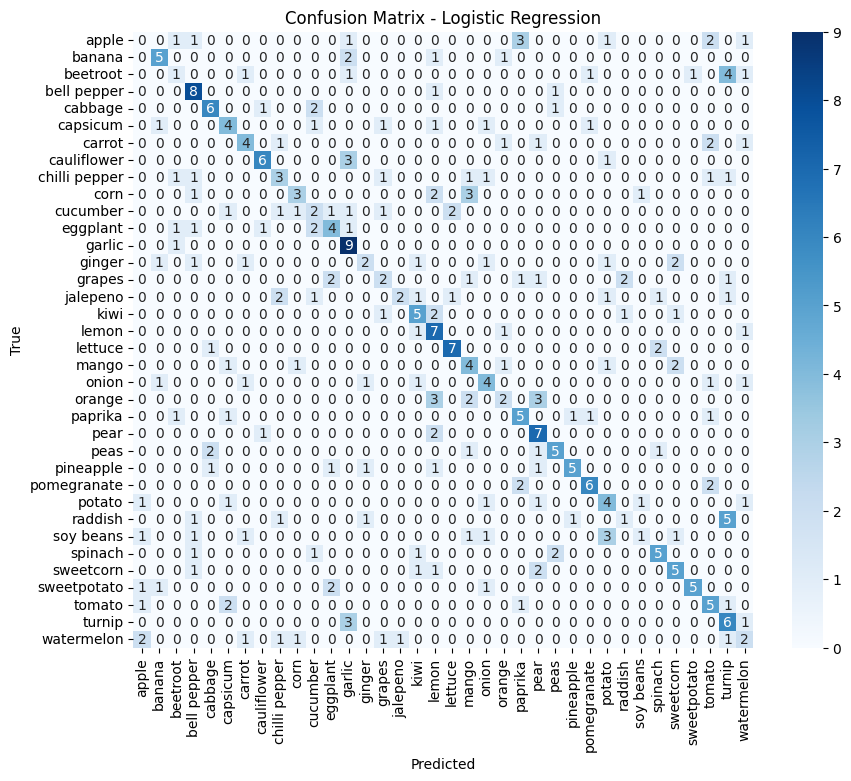

In [13]:
# Modeli değerlendirme
y_pred = logistic_classifier.predict(X_test)

# Sınıflandırma raporu ve confusion matrix hesaplama
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Confusion matrix'i görselleştirme
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=train_generator.class_indices.keys(), yticklabels=train_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

# VGG16 Modeli

In [14]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Veri artırma ve ön işleme için ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    shear_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3
)

valid_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Eğitim verilerini yükleme ve yeniden boyutlandırma
train_generator = train_datagen.flow_from_directory(
    train_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=True
)

# Doğrulama verilerini yükleme ve yeniden boyutlandırma
validation_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False
)

# Test verilerini yükleme ve yeniden boyutlandırma
test_generator = test_datagen.flow_from_directory(
    test_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False
)


Found 3115 images belonging to 36 classes.

Found 351 images belonging to 36 classes.

Found 359 images belonging to 36 classes.


In [15]:
# VGG16 modelini yükleme ve son katmanlarını değiştirme
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# VGG16 taban modelini dondurma (eğitim sırasında ağırlıklar değişmeyecek)
for layer in vgg16_base.layers:
    layer.trainable = False

# Yeni model oluşturma
model = Sequential()
model.add(vgg16_base)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(numberOfClass, activation='softmax'))

# Modeli derleme
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Modeli eğitme
hist = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,  # Eğitim süresini kısaltmak için düşük bir epoch sayısı seçtim, artırabilirsiniz
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

  self._warn_if_super_not_called()


 1/97 ━━━━━━━━━━━━━━━━━━━━ 1:03:32 40s/step - accuracy: 0.0000e+00 - loss: 3.8672


I0000 00:00:1718962791.756497     330 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.

W0000 00:00:1718962791.776343     330 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 7/97 ━━━━━━━━━━━━━━━━━━━━ 3:59 3s/step - accuracy: 0.0274 - loss: 5.9992  

W0000 00:00:1718962807.686888     329 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


15/97 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.0395 - loss: 5.9686

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images

  warnings.warn(


97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1475 - loss: 4.1998

W0000 00:00:1718962903.414950     328 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - accuracy: 0.1483 - loss: 4.1896 - val_accuracy: 0.6344 - val_loss: 1.4206

Epoch 2/10

 1/97 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - accuracy: 0.3750 - loss: 2.0821

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.

  self.gen.throw(typ, value, traceback)


97/97 ━━━━━━━━━━━━━━━━━━━━ 29s 300ms/step - accuracy: 0.3750 - loss: 2.0821 - val_accuracy: 0.8065 - val_loss: 1.2342

Epoch 3/10


W0000 00:00:1718962943.215600     328 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.5255 - loss: 1.7511 - val_accuracy: 0.7969 - val_loss: 0.8954

Epoch 4/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4062 - loss: 1.8113 - val_accuracy: 0.8387 - val_loss: 0.6164

Epoch 5/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.6317 - loss: 1.3238 - val_accuracy: 0.8562 - val_loss: 0.6095

Epoch 6/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5938 - loss: 1.4920 - val_accuracy: 0.9355 - val_loss: 0.3471

Epoch 7/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.7156 - loss: 1.0275 - val_accuracy: 0.8625 - val_loss: 0.4710

Epoch 8/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6562 - loss: 1.2474 - val_accuracy: 0.9677 - val_loss: 0.3022

Epoch 9/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.7770 - loss: 0.7889 - val_accuracy: 0.9062 - val_loss: 0.3591

Epoch 10/10

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8438 - loss: 0.5989 - val_accuracy: 1.0000 - 

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.8969 - loss: 0.4169

Test accuracy: 0.9119318127632141


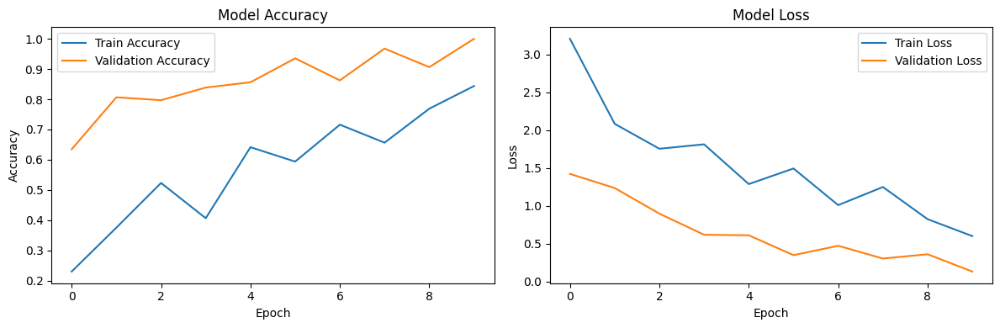

12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 930ms/step


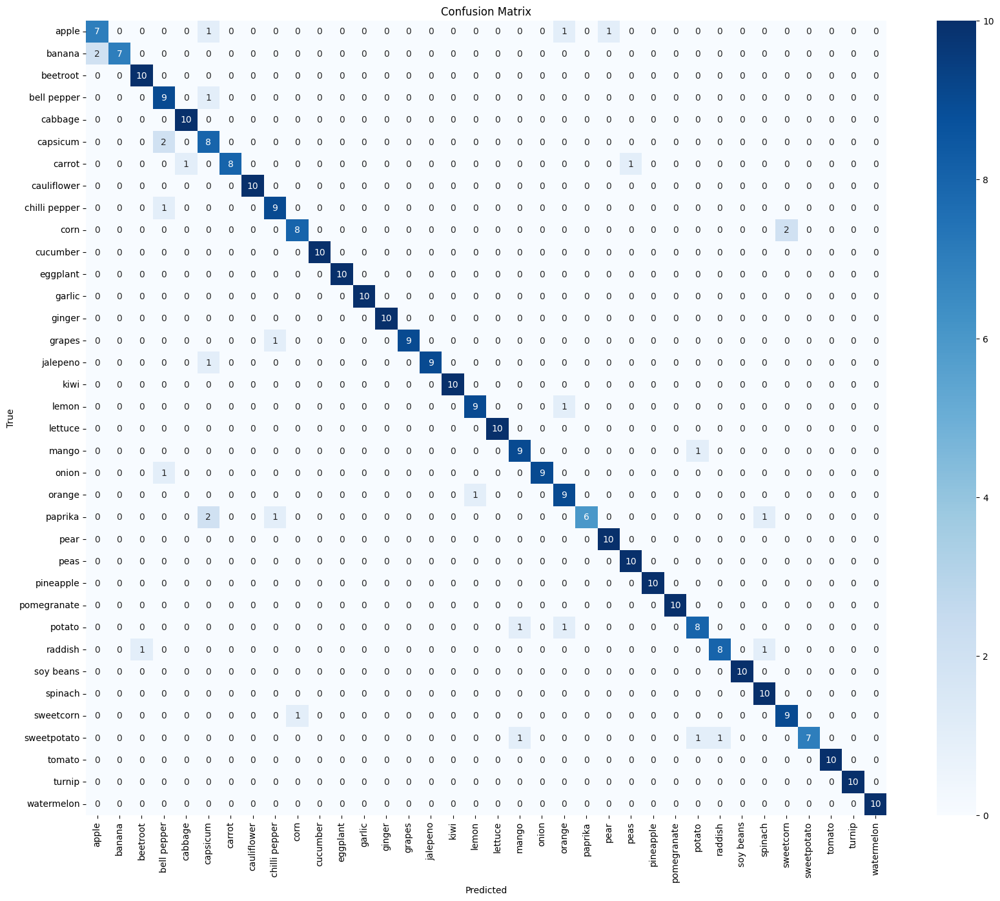

True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 0

True label: 0, Predicted label: 23

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


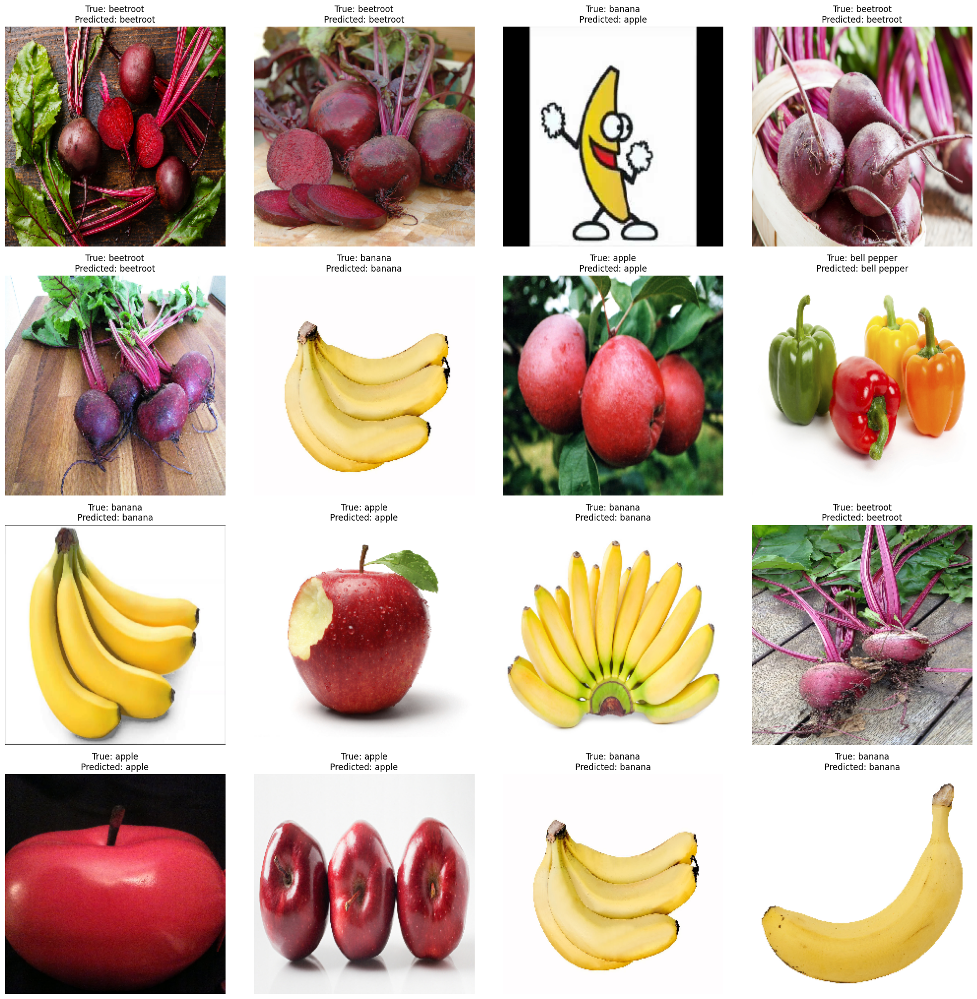

In [18]:
# Modeli değerlendirme
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print('Test accuracy:', accuracy)

# Eğitim ve doğrulama accuracy ve loss grafiklerini çizme
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(hist.history['accuracy'], label='Train Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist.history['loss'], label='Train Loss')
plt.plot(hist.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Test verileri üzerinde tahminlerde bulunma
test_generator.reset()
predictions = model.predict(test_generator)

# Tahminleri sınıf etiketlerine dönüştürme
predicted_classes = np.argmax(predictions, axis=1)

# Gerçek etiketleri elde etme
true_classes = test_generator.classes

# Sınıf isimlerini elde etme
class_labels = list(test_generator.class_indices.keys())

# Confusion matrix'i oluşturma
cm = confusion_matrix(true_classes, predicted_classes)

# Confusion matrix'i görselleştirme
plt.figure(figsize=(20, 16))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Test verilerinden birkaç örneği manuel olarak kontrol etme
for i in range(5):
    print(f"True label: {true_classes[i]}, Predicted label: {predicted_classes[i]}")

# Test veri setinden bir batch alın
test_generator.reset()
batch = next(test_generator)

# Batch içinden rastgele 16 örnek seç
num_samples = 16
indices = np.random.choice(range(len(batch[0])), num_samples, replace=False)
sample_images = batch[0][indices]
sample_labels = batch[1][indices]

# Tahminlerde bulun
predictions = model.predict(sample_images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(sample_labels, axis=1)
class_labels = list(test_generator.class_indices.keys())

# Görselleri gösterme
plt.figure(figsize=(20, 20))
for i in range(num_samples):
    plt.subplot(4, 4, i + 1)
    plt.imshow(sample_images[i])
    plt.axis('off')
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')

plt.tight_layout()
plt.show()


In [17]:
from sklearn.metrics import classification_report

# Test verileri üzerinde tahminlerde bulunma
test_generator.reset()  # Generator'ı sıfırlamak önemli
predictions = model.predict(test_generator)

# Tahminleri sınıf etiketlerine dönüştürme
predicted_classes = np.argmax(predictions, axis=1)

# Gerçek etiketleri elde etme
true_classes = test_generator.classes

# Sınıf isimlerini elde etme
class_labels = list(test_generator.class_indices.keys())

# Sınıflandırma raporunu yazdırma
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 936ms/step

               precision    recall  f1-score   support



        apple       0.78      0.70      0.74        10

       banana       1.00      0.78      0.88         9

     beetroot       0.91      1.00      0.95        10

  bell pepper       0.69      0.90      0.78        10

      cabbage       0.91      1.00      0.95        10

     capsicum       0.62      0.80      0.70        10

       carrot       1.00      0.80      0.89        10

  cauliflower       1.00      1.00      1.00        10

chilli pepper       0.82      0.90      0.86        10

         corn       0.89      0.80      0.84        10

     cucumber       1.00      1.00      1.00        10

     eggplant       1.00      1.00      1.00        10

       garlic       1.00      1.00      1.00        10

       ginger       1.00      1.00      1.00        10

       grapes       1.00      0.90      0.95        10

     jalepeno       1.00      0.90      0.95        10

   

In [6]:
import numpy as np
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Veri artırma ve ön işleme için ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    shear_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3
)

valid_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Eğitim verilerini yükleme ve yeniden boyutlandırma
train_generator = train_datagen.flow_from_directory(
    train_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=True
)

# Test verilerini yükleme ve yeniden boyutlandırma
test_generator = test_datagen.flow_from_directory(
    test_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False
)

# Eğitim verilerini numpy dizilerine dönüştürme
X_train = []
y_train = []
for _ in range(len(train_generator)):
    x_batch, y_batch = next(train_generator)
    X_train.append(x_batch)
    y_train.append(y_batch)

X_train = np.concatenate(X_train)
y_train = np.concatenate(y_train)

# Test verilerini numpy dizilerine dönüştürme
X_test = []
y_test = []
for _ in range(len(test_generator)):
    x_batch, y_batch = next(test_generator)
    X_test.append(x_batch)
    y_test.append(y_batch)

X_test = np.concatenate(X_test)
y_test = np.concatenate(y_test)

# Verileri düzleştirme
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = np.argmax(y_train, axis=1)
y_test = np.argmax(y_test, axis=1)

Found 3115 images belonging to 36 classes.
Found 359 images belonging to 36 classes.


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


# SVM Modeli

SVM Classification Report:
              precision    recall  f1-score   support

           0       0.33      0.40      0.36        10
           1       0.53      0.89      0.67         9
           2       0.67      0.60      0.63        10
           3       0.25      0.30      0.27        10
           4       0.90      0.90      0.90        10
           5       0.40      0.60      0.48        10
           6       0.71      0.50      0.59        10
           7       0.40      0.40      0.40        10
           8       0.00      0.00      0.00        10
           9       0.20      0.10      0.13        10
          10       0.56      0.50      0.53        10
          11       0.62      0.80      0.70        10
          12       0.41      0.70      0.52        10
          13       0.50      0.30      0.37        10
          14       0.57      0.40      0.47        10
          15       0.38      0.30      0.33        10
          16       0.75      0.90      0.82        10


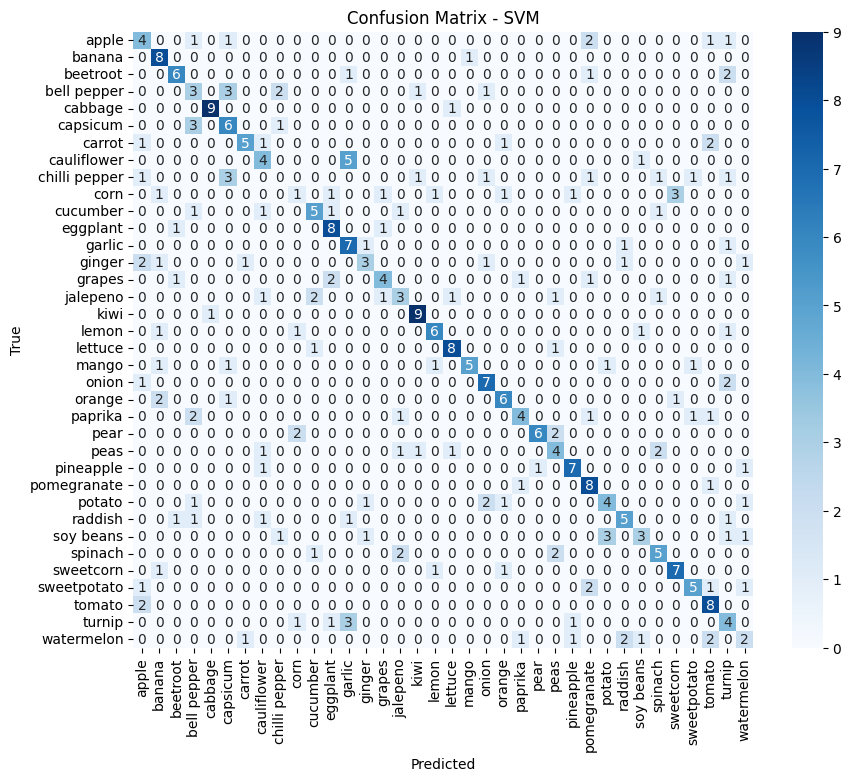

In [7]:
# SVM Modeli
svm_classifier = SVC(kernel='linear')
svm_classifier.fit(X_train, y_train)
y_pred_svm = svm_classifier.predict(X_test)

print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))

cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(10, 8))
sns.heatmap(cm_svm, annot=True, cmap='Blues', fmt='d', xticklabels=train_generator.class_indices.keys(), yticklabels=train_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - SVM')
plt.show()

# Random Forest Modeli

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.50      0.62        10
           1       0.78      0.78      0.78         9
           2       0.47      0.80      0.59        10
           3       0.50      0.50      0.50        10
           4       0.47      0.80      0.59        10
           5       0.78      0.70      0.74        10
           6       0.71      1.00      0.83        10
           7       0.64      0.90      0.75        10
           8       0.00      0.00      0.00        10
           9       1.00      0.10      0.18        10
          10       0.50      0.70      0.58        10
          11       0.75      0.60      0.67        10
          12       0.62      0.80      0.70        10
          13       0.75      0.60      0.67        10
          14       0.80      0.80      0.80        10
          15       0.80      0.40      0.53        10
          16       0.64      0.90      0.75 

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


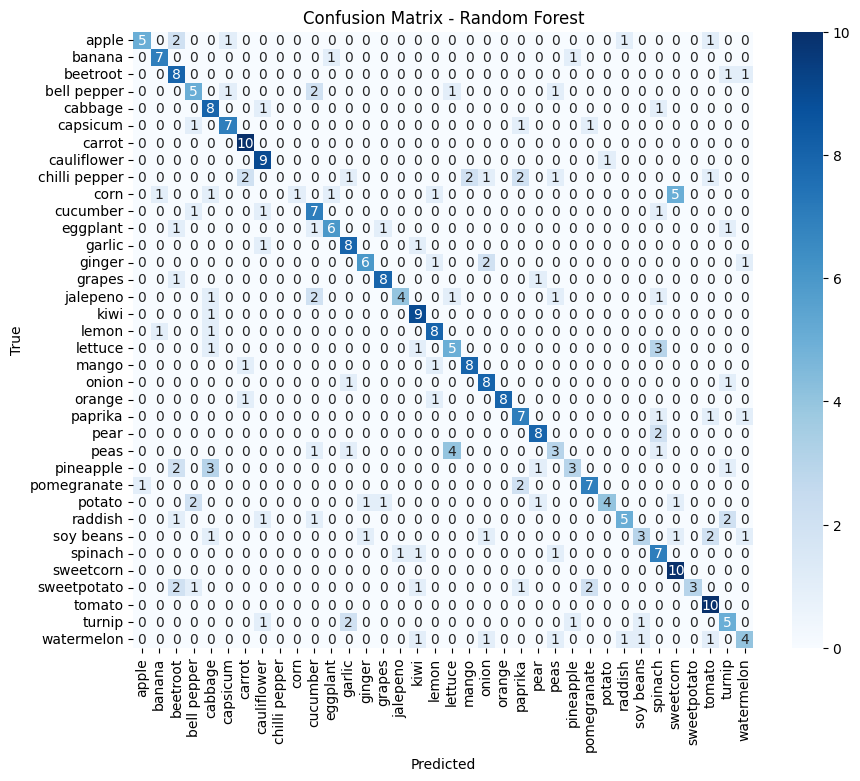

In [8]:
# Random Forest Modeli
rf_classifier = RandomForestClassifier(n_estimators=100)
rf_classifier.fit(X_train, y_train)
y_pred_rf = rf_classifier.predict(X_test)

print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(10, 8))
sns.heatmap(cm_rf, annot=True, cmap='Blues', fmt='d', xticklabels=train_generator.class_indices.keys(), yticklabels=train_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Random Forest')
plt.show()



# MobileNetv2

In [7]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Veri artırma ve ön işleme için ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    shear_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3
)

valid_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Eğitim verilerini yükleme ve yeniden boyutlandırma
train_generator = train_datagen.flow_from_directory(
    train_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=True
)

# Doğrulama verilerini yükleme ve yeniden boyutlandırma
validation_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False
)

# Test verilerini yükleme ve yeniden boyutlandırma
test_generator = test_datagen.flow_from_directory(
    test_path, 
    target_size=(224, 224),
    batch_size=32,
    color_mode="rgb",
    class_mode="categorical",
    shuffle=False
)




Found 3115 images belonging to 36 classes.
Found 351 images belonging to 36 classes.
Found 359 images belonging to 36 classes.


In [8]:
# MobileNetV2 modelini yükleme ve son katmanlarını değiştirme
mobilenet_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# MobileNetV2 taban modelini dondurma (eğitim sırasında ağırlıklar değişmeyecek)
for layer in mobilenet_base.layers:
    layer.trainable = False

# Yeni model oluşturma
model = Sequential()
model.add(mobilenet_base)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dense(numberOfClass, activation='softmax'))

# Modeli derleme
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])




9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
# Modeli eğitme
hist = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,  
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


 1/97 ━━━━━━━━━━━━━━━━━━━━ 41:15 26s/step - accuracy: 0.0000e+00 - loss: 3.9979

I0000 00:00:1719056671.130230     142 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1719056671.161423     142 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4261 - loss: 2.2509

W0000 00:00:1719056802.349848     145 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1719056810.089819     142 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.4278 - loss: 2.2430 - val_accuracy: 0.8531 - val_loss: 0.4781
Epoch 2/10
 1/97 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.7500 - loss: 0.9419

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


97/97 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - accuracy: 0.7500 - loss: 0.9419 - val_accuracy: 1.0000 - val_loss: 0.1850
Epoch 3/10


W0000 00:00:1719056828.753559     145 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.7881 - loss: 0.6931 - val_accuracy: 0.9281 - val_loss: 0.3021
Epoch 4/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8438 - loss: 0.4775 - val_accuracy: 0.9355 - val_loss: 0.1828
Epoch 5/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - accuracy: 0.8611 - loss: 0.4205 - val_accuracy: 0.9031 - val_loss: 0.2839
Epoch 6/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7812 - loss: 0.4342 - val_accuracy: 1.0000 - val_loss: 0.0624
Epoch 7/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.8806 - loss: 0.3511 - val_accuracy: 0.9219 - val_loss: 0.2654
Epoch 8/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8438 - loss: 0.4893 - val_accuracy: 1.0000 - val_loss: 0.0487
Epoch 9/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.9156 - loss: 0.2699 - val_accuracy: 0.9406 - val_loss: 0.2221
Epoch 10/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9062 - loss: 0.1927 - val_accuracy: 1.0000 - val_loss: 0.12

11/11 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.9390 - loss: 0.3384
Test accuracy: 0.9517045617103577


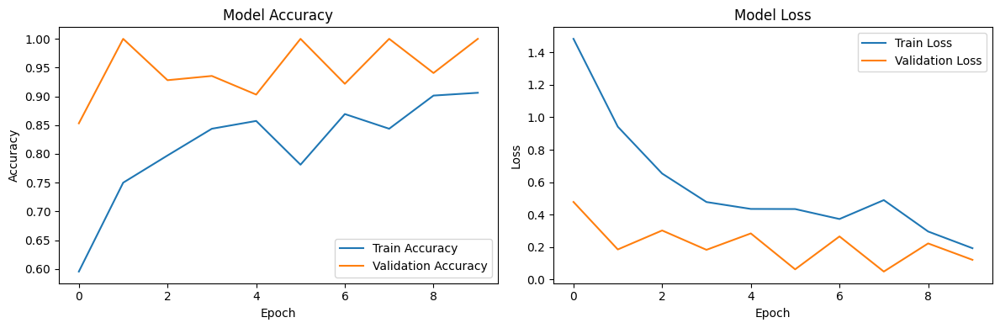

 1/12 ━━━━━━━━━━━━━━━━━━━━ 43s 4s/step

W0000 00:00:1719057328.561764     142 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step 


W0000 00:00:1719057342.254051     144 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


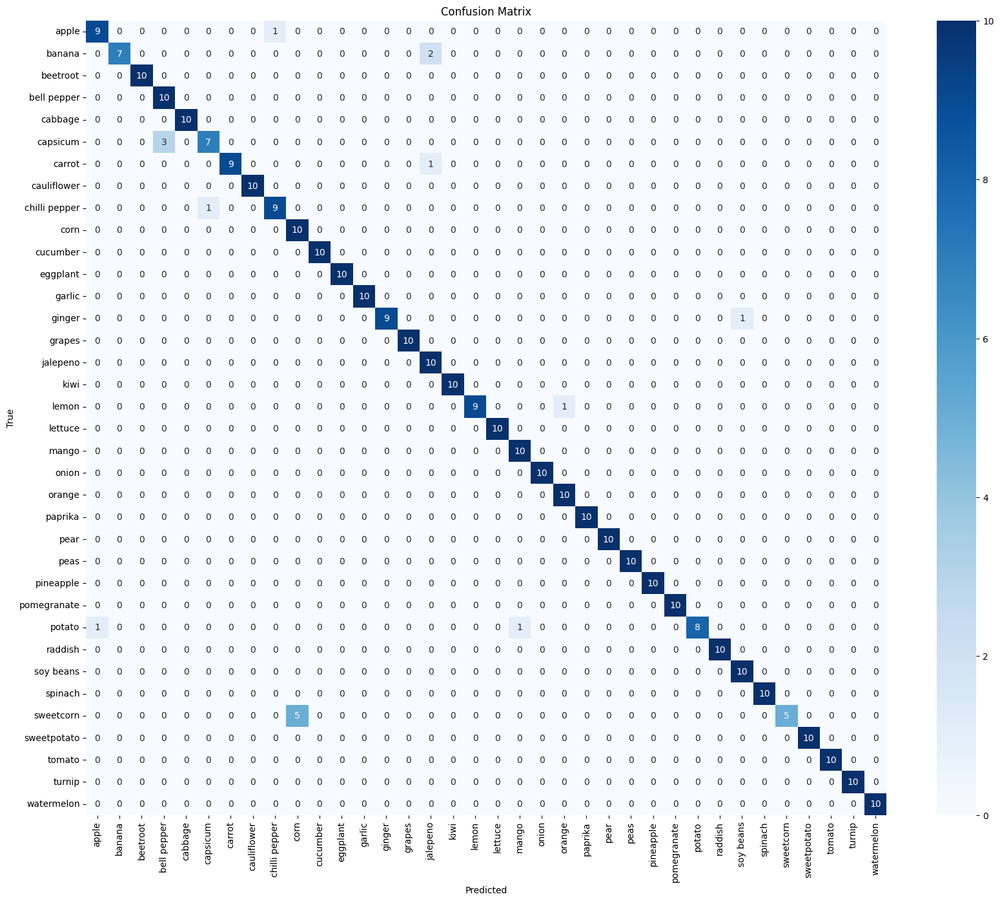

               precision    recall  f1-score   support

        apple       0.90      0.90      0.90        10
       banana       1.00      0.78      0.88         9
     beetroot       1.00      1.00      1.00        10
  bell pepper       0.77      1.00      0.87        10
      cabbage       1.00      1.00      1.00        10
     capsicum       0.88      0.70      0.78        10
       carrot       1.00      0.90      0.95        10
  cauliflower       1.00      1.00      1.00        10
chilli pepper       0.90      0.90      0.90        10
         corn       0.67      1.00      0.80        10
     cucumber       1.00      1.00      1.00        10
     eggplant       1.00      1.00      1.00        10
       garlic       1.00      1.00      1.00        10
       ginger       1.00      0.90      0.95        10
       grapes       1.00      1.00      1.00        10
     jalepeno       0.77      1.00      0.87        10
         kiwi       1.00      1.00      1.00        10
        l

In [10]:
# Modeli değerlendirme
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print('Test accuracy:', accuracy)

# Eğitim ve doğrulama accuracy ve loss grafiklerini çizme
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(hist.history['accuracy'], label='Train Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist.history['loss'], label='Train Loss')
plt.plot(hist.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Test verileri üzerinde tahminlerde bulunma
test_generator.reset()
predictions = model.predict(test_generator)

# Tahminleri sınıf etiketlerine dönüştürme
predicted_classes = np.argmax(predictions, axis=1)

# Gerçek etiketleri elde etme
true_classes = test_generator.classes

# Sınıf isimlerini elde etme
class_labels = list(test_generator.class_indices.keys())

# Confusion matrix'i oluşturma
cm = confusion_matrix(true_classes, predicted_classes)

# Confusion matrix'i görselleştirme
plt.figure(figsize=(20, 16))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Sınıflandırma raporunu yazdırma
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# F1 score, recall, precision hesaplama
precision = precision_score(true_classes, predicted_classes, average='weighted')
recall = recall_score(true_classes, predicted_classes, average='weighted')
f1 = f1_score(true_classes, predicted_classes, average='weighted')

print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')